In [11]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2

In [20]:
def create_lm_list(path):
    list_of_lm = []
    for filename in os.listdir(path):
        if not filename.endswith(".csv"):
            list_of_lm.append(filename)
    return list_of_lm

DATADIR = r"C:\\Users\\Snir\\PycharmProjects\\Google-Landmark-Retrieval-Challenge\\train"
CATEGORIES = create_lm_list(DATADIR)


for category in CATEGORIES:
    path = os.path.join(DATADIR, category)  # path to cats or dogs dir
    for img in os.listdir(path):
        img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)

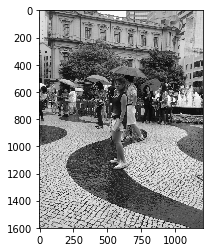

In [44]:
plt.imshow(img_array, cmap='gray')
plt.show()

In [45]:
print("The shape of the image is ", img_array.shape)
print(img_array)

The shape of the image is  (1600, 1200)
[[214 214 214 ... 214 214 213]
 [218 217 217 ... 214 213 213]
 [221 221 221 ... 214 213 212]
 ...
 [191 190 190 ...  83  83  84]
 [191 190 194 ...  84  83  83]
 [191 195 201 ...  84  83  83]]


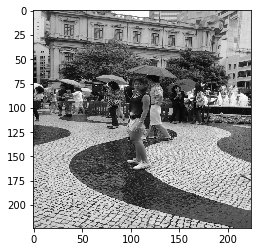

In [46]:
IMG_SIZE = 224  #Setting the constant size of each image
new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))

plt.imshow(new_array, cmap = 'gray')
plt.show()

In [47]:
training_data = []

def create_training_data():
    for category in CATEGORIES:
        path = os.path.join(DATADIR, category)  # path to cats or dogs dir
        class_num = CATEGORIES.index(category)  #setting that 0 is a dog and 1 is a cat
        for img in os.listdir(path):
            try:
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
                new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
                training_data.append([new_array, class_num])
            except Exception as e:
                pass   # do nothing
            
create_training_data()

In [48]:
print(len(training_data))

10055


In [49]:
import random

random.shuffle(training_data)

In [50]:
for sample in training_data[:10]:
    print(sample[1])

17
92
17
6
56
15
97
96
83
61


In [51]:
random.shuffle(training_data)

In [52]:
for sample in training_data[:10]:
    print(sample[1])

86
88
76
69
69
86
80
64
8
24


In [53]:
X = []
y = []

for features, label in training_data:
    X.append(features)
    y.append(label)

# We need to convert the List of images to a numpy array for Tensorflow
# We create a numpy array where the image is in the shape of (50,50,1). 1 since this is a grey scale
X = np.array(X).reshape(-1, IMG_SIZE, IMG_SIZE, 1)
print(X[0].shape)

(224, 224, 1)


In [54]:
import pickle 

pickle_out = open("X.pickle", "wb")
pickle.dump(X, pickle_out)
pickle_out.close()

pickle_out = open("y.pickle", "wb")
pickle.dump(y, pickle_out)
pickle_out.close()

In [55]:
pickle_in = open("X.pickle", "rb")
X = pickle.load(pickle_in)

In [56]:
X[1]

array([[[ 63],
        [ 62],
        [ 62],
        ...,
        [ 99],
        [ 99],
        [100]],

       [[ 63],
        [ 62],
        [ 62],
        ...,
        [ 96],
        [ 97],
        [ 97]],

       [[ 63],
        [ 62],
        [ 62],
        ...,
        [ 99],
        [100],
        [100]],

       ...,

       [[  1],
        [  1],
        [  1],
        ...,
        [181],
        [178],
        [181]],

       [[  1],
        [  1],
        [  1],
        ...,
        [179],
        [181],
        [180]],

       [[  1],
        [  1],
        [  1],
        ...,
        [177],
        [183],
        [178]]], dtype=uint8)

In [57]:
Y[1]

NameError: name 'Y' is not defined

In [58]:
y

[86,
 88,
 76,
 69,
 69,
 86,
 80,
 64,
 8,
 24,
 65,
 48,
 82,
 82,
 94,
 28,
 68,
 50,
 30,
 12,
 19,
 2,
 79,
 77,
 92,
 23,
 15,
 38,
 56,
 69,
 69,
 73,
 71,
 47,
 49,
 23,
 89,
 34,
 10,
 96,
 68,
 84,
 88,
 8,
 80,
 5,
 11,
 42,
 91,
 80,
 21,
 96,
 91,
 1,
 69,
 73,
 32,
 6,
 72,
 30,
 71,
 42,
 35,
 6,
 57,
 33,
 26,
 17,
 82,
 28,
 16,
 43,
 45,
 94,
 8,
 46,
 66,
 50,
 76,
 26,
 17,
 44,
 41,
 30,
 19,
 61,
 45,
 30,
 91,
 63,
 55,
 61,
 81,
 54,
 59,
 29,
 74,
 81,
 26,
 3,
 91,
 19,
 99,
 82,
 50,
 42,
 67,
 52,
 11,
 35,
 11,
 52,
 95,
 84,
 68,
 73,
 50,
 48,
 11,
 25,
 67,
 38,
 30,
 67,
 69,
 58,
 51,
 22,
 11,
 82,
 14,
 7,
 99,
 71,
 16,
 61,
 88,
 0,
 63,
 11,
 1,
 32,
 39,
 45,
 16,
 56,
 2,
 97,
 35,
 44,
 39,
 41,
 21,
 57,
 62,
 53,
 87,
 11,
 14,
 48,
 13,
 74,
 56,
 89,
 71,
 63,
 62,
 87,
 45,
 47,
 78,
 22,
 89,
 72,
 43,
 96,
 79,
 32,
 64,
 20,
 46,
 1,
 3,
 83,
 25,
 32,
 38,
 91,
 32,
 23,
 61,
 57,
 72,
 55,
 83,
 52,
 56,
 0,
 86,
 8,
 27,
 2,
 34,
 99

In [59]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping
import pickle

C:\Users\Snir\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [60]:
pickle_in = open("X.pickle", "rb")
X = pickle.load(pickle_in)

pickle_in = open("y.pickle", "rb")
y = pickle.load(pickle_in)

In [61]:
X = X/255.0

In [62]:
X

array([[[[0.59215686],
         [0.60784314],
         [0.62352941],
         ...,
         [0.31764706],
         [0.4627451 ],
         [0.44705882]],

        [[0.61960784],
         [0.63137255],
         [0.64313725],
         ...,
         [0.40392157],
         [0.12941176],
         [0.19215686]],

        [[0.63921569],
         [0.65490196],
         [0.66666667],
         ...,
         [0.1254902 ],
         [0.09803922],
         [0.08235294]],

        ...,

        [[0.13333333],
         [0.10588235],
         [0.09019608],
         ...,
         [0.1254902 ],
         [0.12941176],
         [0.1372549 ]],

        [[0.10588235],
         [0.11764706],
         [0.1254902 ],
         ...,
         [0.14509804],
         [0.14901961],
         [0.15686275]],

        [[0.16470588],
         [0.17254902],
         [0.16078431],
         ...,
         [0.14901961],
         [0.14509804],
         [0.14509804]]],


       [[[0.24705882],
         [0.24313725],
         [0.24

In [63]:
model = Sequential()
model.add(Conv2D(64, (2,2), input_shape = X.shape[1:]))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(4,4)))

In [64]:
model.add(Conv2D(64, (3,3)))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(2,2)))

#Flatening the data
model.add(Flatten())
model.add(Dense(64))
model.add(Activation("relu"))

#output layer
model.add(Dense())
model.add(Activation('softmax'))

In [65]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 222, 222, 64)      640       
_________________________________________________________________
activation (Activation)      (None, 222, 222, 64)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 111, 111, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 109, 109, 64)      36928     
_________________________________________________________________
activation_1 (Activation)    (None, 109, 109, 64)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 54, 54, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 186624)            0         
__________

In [66]:
adamOptimizer = tf.keras.optimizers.Adam(lr=0.001)

model.compile(loss = 'sparse_categorical_crossentropy', 
             optimizer='adam',
             metrics=['accuracy'])

In [70]:
import time

class TrainValTensorBoard(TensorBoard):
    def __init__(self, log_dir='.\logs', **kwargs):
        NAME = "GLM_T-{}".format(int(time.time()))
        # Make the original `TensorBoard` log to a subdirectory 'training'
        training_log_dir = os.path.join(log_dir, "%s_%s" % (NAME,"Training"))
        super(TrainValTensorBoard, self).__init__(training_log_dir, **kwargs)

        # Log the validation metrics to a separate subdirectory
        self.val_log_dir = os.path.join(log_dir, "%s_%s" % (NAME,'validation'))

    def set_model(self, model):
        # Setup writer for validation metrics
        self.val_writer = tf.summary.FileWriter(self.val_log_dir)
        super(TrainValTensorBoard, self).set_model(model)

    def on_epoch_end(self, epoch, logs=None):
        # Pop the validation logs and handle them separately with
        # `self.val_writer`. Also rename the keys so that they can
        # be plotted on the same figure with the training metrics
        logs = logs or {}
        val_logs = {k.replace('val_', 'epoch_'): v for k, v in logs.items() if k.startswith('val_')}
        for name, value in val_logs.items():
            summary = tf.Summary()
            summary_value = summary.value.add()
            summary_value.simple_value = value.item()
            summary_value.tag = name
            self.val_writer.add_summary(summary, epoch)
        self.val_writer.flush()

        # Pass the remaining logs to `TensorBoard.on_epoch_end`
        logs = {k: v for k, v in logs.items() if not k.startswith('val_')}
        super(TrainValTensorBoard, self).on_epoch_end(epoch, logs)

    def on_train_end(self, logs=None):
        super(TrainValTensorBoard, self).on_train_end(logs)
        self.val_writer.close()

In [71]:
model.fit(X, y, batch_size=32, epochs = 3, validation_split=0.1, callbacks=[TrainValTensorBoard(write_graph=False)])

Train on 9049 samples, validate on 1006 samples
Epoch 1/3
9049/9049 [==============================] - 581s 64ms/step - loss: 4.4856 - acc: 0.0354 - val_loss: 4.2499 - val_acc: 0.0706
Epoch 2/3
9049/9049 [==============================] - 309s 34ms/step - loss: 3.6955 - acc: 0.1789 - val_loss: 3.5743 - val_acc: 0.2107
Epoch 3/3
9049/9049 [==============================] - 311s 34ms/step - loss: 2.3855 - acc: 0.4312 - val_loss: 3.4402 - val_acc: 0.2515


In [72]:
train_loss, train_acc = model.evaluate(X,y)

10055/10055 [==============================] - 109s 11ms/step


In [73]:
train_loss

1.398600490196376

In [74]:
train_acc

0.7028344107453708

In [75]:
import random

IMG_SIZE = 224  #Setting the constant size of each image
training_data = []
for category in CATEGORIES:
    count = 0;                
    path = os.path.join(DATADIR, category)  # path to cats or dogs dir
    class_num = CATEGORIES.index(category)  #setting that 0 is a dog and 1 is a cat
    for img in os.listdir(path):
        count = count + 1;               # increase the image count
        try:
            img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
            training_data.append([img_array, class_num])
        except Exception as e:
            pass   # do nothing
        if count == 5:
            break;
        
random.shuffle(training_data)
testPairs = training_data;     # Getting a sample of 10 images

process_test =[cv2.resize(pair[0], (IMG_SIZE, IMG_SIZE))/255.0 for pair in testPairs] # resizing the images
test_labels = [pair[1] for pair in testPairs]
process_test= np.array(process_test).reshape(-1, IMG_SIZE, IMG_SIZE, 1)   # resize the array for the model
predictions = model.predict(process_test)

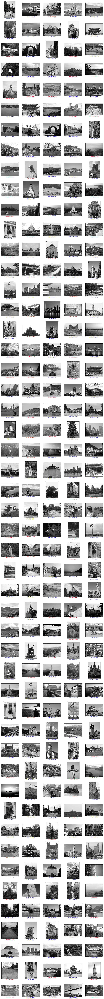

In [80]:
import matplotlib.pyplot as plt

def plot_image(i, predictions_array, true_label, img):
  predictions_array, true_label, img = predictions_array[i], true_label[i], img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  
  plt.imshow(img, cmap='gray')

  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'
  
  plt.xlabel("{} {:2.0f}% ({})".format(CATEGORIES[predicted_label],
                                100*np.max(predictions_array),
                                CATEGORIES[true_label]),
                                color=color)

num_rows = 50
num_cols = 5
num_images = num_rows*num_cols
plt.figure(figsize=(2*2*num_cols, 2*2*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, num_cols, i+1)
  plot_image(i, predictions, test_labels, [pair[0] for pair in testPairs])

In [173]:
IMG_SIZE = 224  #Setting the constant size of each image
test_data = []

#for category in CATEGORIES:
#    count = 0;                
#    path = os.path.join(DATADIR, category)  # path to cats or dogs dir
#    class_num = CATEGORIES.index(category)  #setting that 0 is a dog and 1 is a cat
#    for img in os.listdir(path):
#        count = count + 1;               # increase the image count
#        try:
#            img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
#            training_data.append(img_array)
#        except Exception as e:
#            pass   # do nothing
#        if count == 1:
#            break;
 
try:
    img_array = cv2.imread('C:\\Users\\Snir\\Desktop\\METZADA-110820_AG7N2470_8428_Metzada_flpics1.jpg', cv2.IMREAD_GRAYSCALE)
    test_data.append(img_array)
except Exception as e:
    pass   # do nothing


process_test =[cv2.resize(test_data[0], (IMG_SIZE, IMG_SIZE))/255.0] # resizing the images
# test_labels = [pair[1] for pair in testPairs]

# process_test= np.array(process_test).reshape(-1, IMG_SIZE, IMG_SIZE, 1)   # resize the array for the model
process_test= np.array(process_test).reshape(-1, IMG_SIZE, IMG_SIZE, 1) 
predictions = model.predict(process_test)

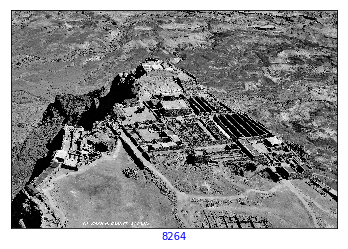

In [174]:
def plot_image(predictions_array, img):
  predictions_array, img = predictions_array[0], img
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  
  plt.imshow(img, cmap='gray')

  predicted_label = np.argmax(predictions_array)
  if True:
    color = 'blue'
  
  plt.xlabel("{}".format(CATEGORIES[predicted_label]),
                                color=color)


plot_image(predictions, test_data[0])